# import the libraries


In [18]:
import os
import librosa
import numpy as np
import pandas as pd

In [19]:
files = []
l = ["raaga/"+l for l in os.listdir("raaga")]

for filepath in l:
    for wav_files in os.listdir(filepath):
        if wav_files.endswith(".wav"):
            files.append(wav_files)
    
        
print(files)
print(len(files))
        

['darbari_4.wav', 'darbari_0.wav', 'darbari_1.wav', 'darbari_3.wav', 'darbari_2.wav', 'bageshree_48.wav', 'bageshree_74.wav', 'bageshree_60.wav', 'bageshree_61.wav', 'bageshree_75.wav', 'bageshree_49.wav', 'bageshree_63.wav', 'bageshree_77.wav', 'bageshree_88.wav', 'bageshree_89.wav', 'bageshree_76.wav', 'bageshree_62.wav', 'bageshree_66.wav', 'bageshree_72.wav', 'bageshree_73.wav', 'bageshree_67.wav', 'bageshree_71.wav', 'bageshree_65.wav', 'bageshree_59.wav', 'bageshree_58.wav', 'bageshree_64.wav', 'bageshree_70.wav', 'bageshree_17.wav', 'bageshree_0.wav', 'bageshree_1.wav', 'bageshree_16.wav', 'bageshree_28.wav', 'bageshree_14.wav', 'bageshree_3.wav', 'bageshree_2.wav', 'bageshree_15.wav', 'bageshree_29.wav', 'bageshree_11.wav', 'bageshree_39.wav', 'bageshree_6.wav', 'bageshree_7.wav', 'bageshree_38.wav', 'bageshree_10.wav', 'bageshree_12.wav', 'bageshree_5.wav', 'bageshree_4.wav', 'bageshree_13.wav', 'bageshree_36.wav', 'bageshree_22.wav', 'bageshree_9.wav', 'bageshree_8.wav', 'bag

In [20]:
import IPython.display as ipd
import librosa.display

import matplotlib.pyplot as plt
%matplotlib inline

# EDA

In [47]:
sample_list = ["./raaga/bhairavi/bhairavi_6.wav", "./raaga/bageshree/bageshree_3.wav", "./raaga/asavari/asavari_1.wav",
               "./raaga/bhoop/bhoop_12.wav", "./raaga/bhoopali/bhoopali_0.wav", "./raaga/darbari/darbari_3.wav",
               "./raaga/dkanada/dkanada_3.wav", "./raaga/sarang/sarang_10.wav", "./raaga/malkauns/malkauns_2.wav", 
               "./raaga/yaman/yaman_18.wav"]

## plotting the wavplt, Log-frequency power spectrogram, Chromagram and MFCC

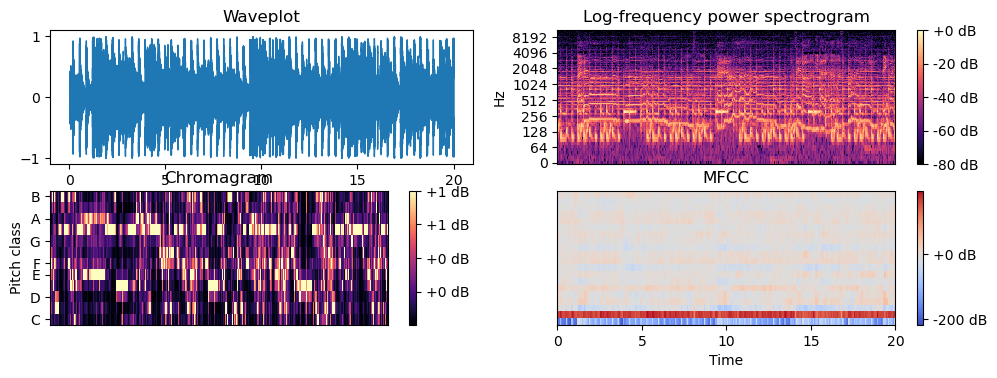

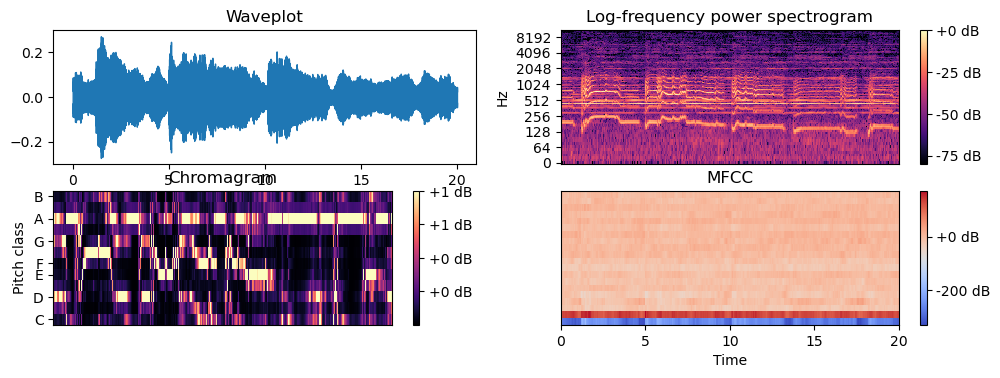

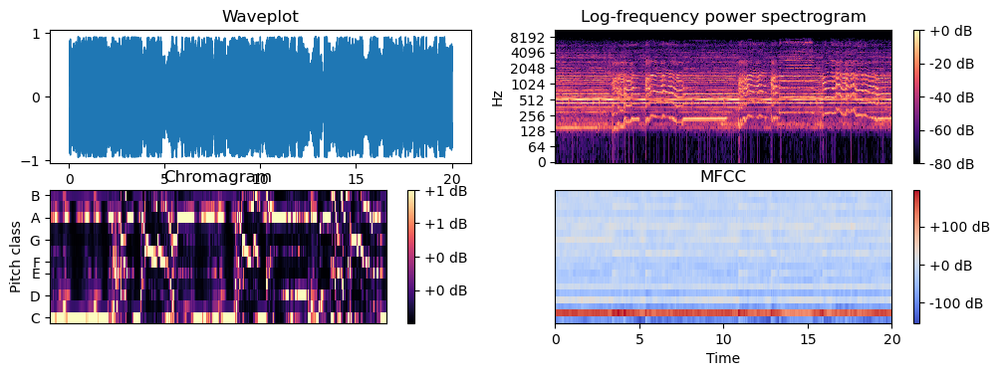

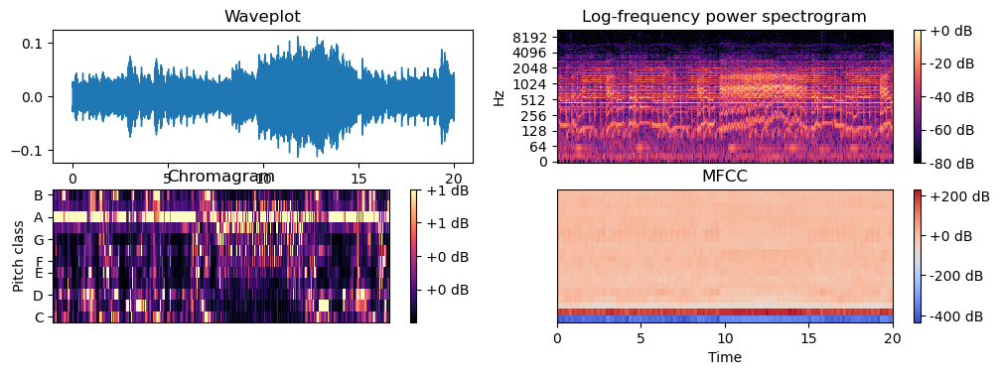

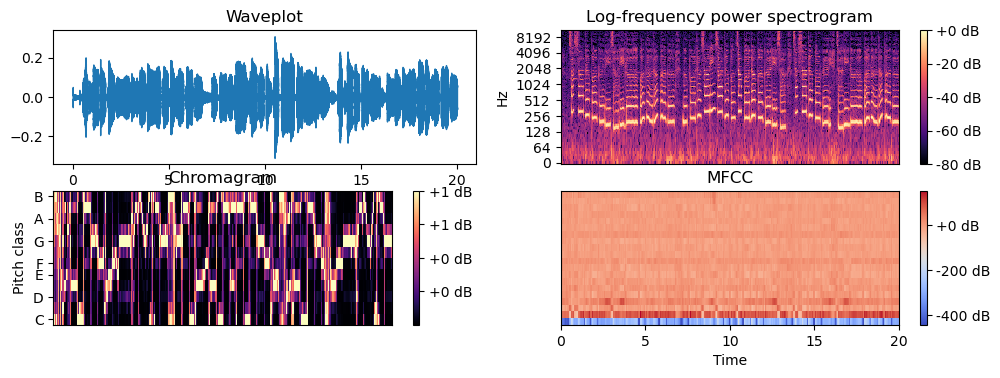

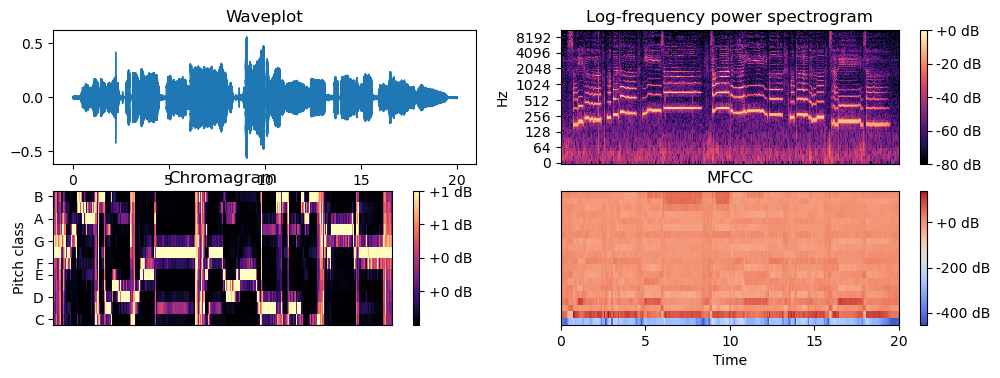

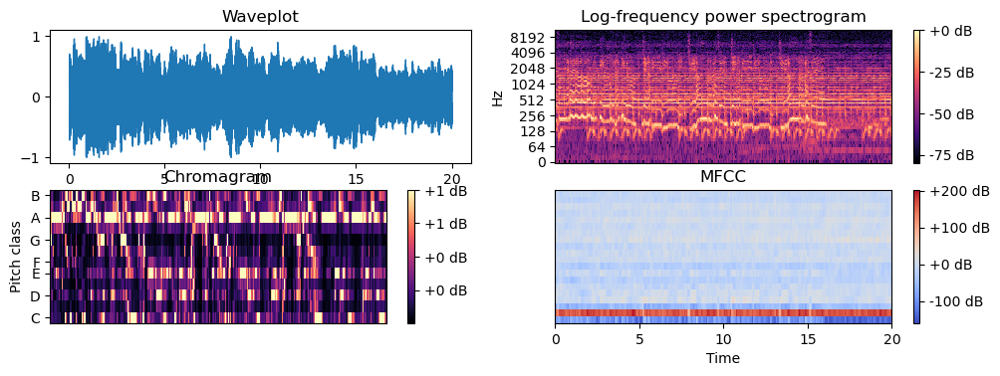

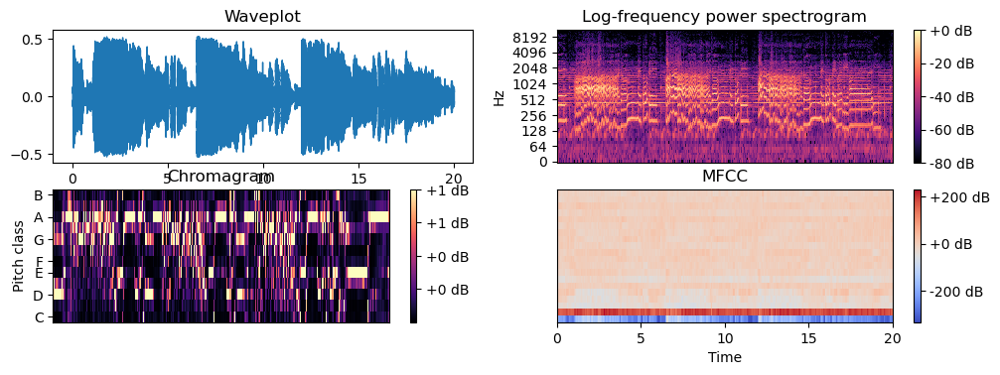

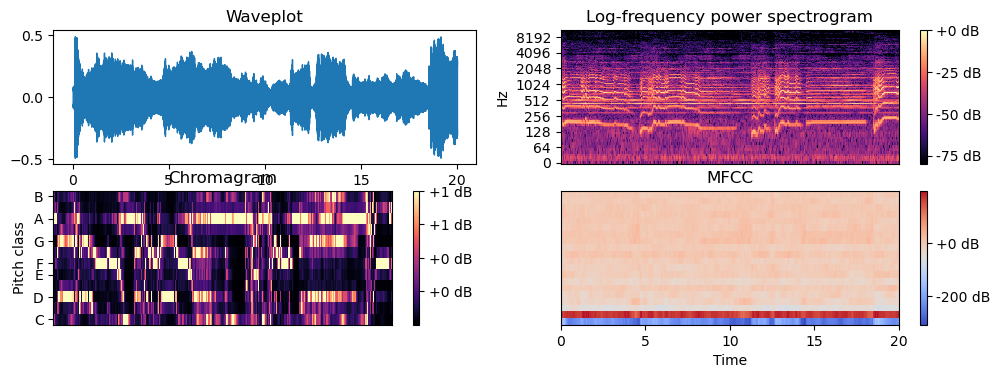

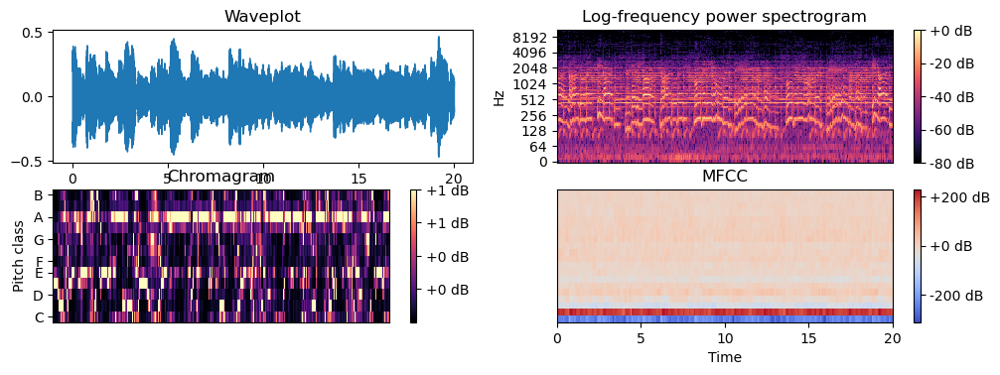

In [48]:
for sample in sample_list:
    y, sr = librosa.load(sample)
    ipd.Audio(y, rate=sr)
    
    plt.figure(figsize=(12, 8))
    
    plt.subplot(4, 2, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title('waveplot')
    
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    plt.subplot(4, 2, 2)
    librosa.display.specshow(D, y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Log-frequency power spectrogram')
    
    plt.subplot(4, 2, 3)
    chroma = librosa.feature.chroma_stft(y=y, sr=sr)
    librosa.display.specshow(chroma, y_axis='chroma')
    plt.colorbar(format='%+2.0f dB')
    plt.title('chromagram')
    
    plt.subplot(4, 2, 4)
    mfccs = librosa.feature.mfcc(y=y, sr=sr)
    librosa.display.specshow(mfccs, x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title('MFCC')
    
    plt.show()



## Plotting spectral centroid 

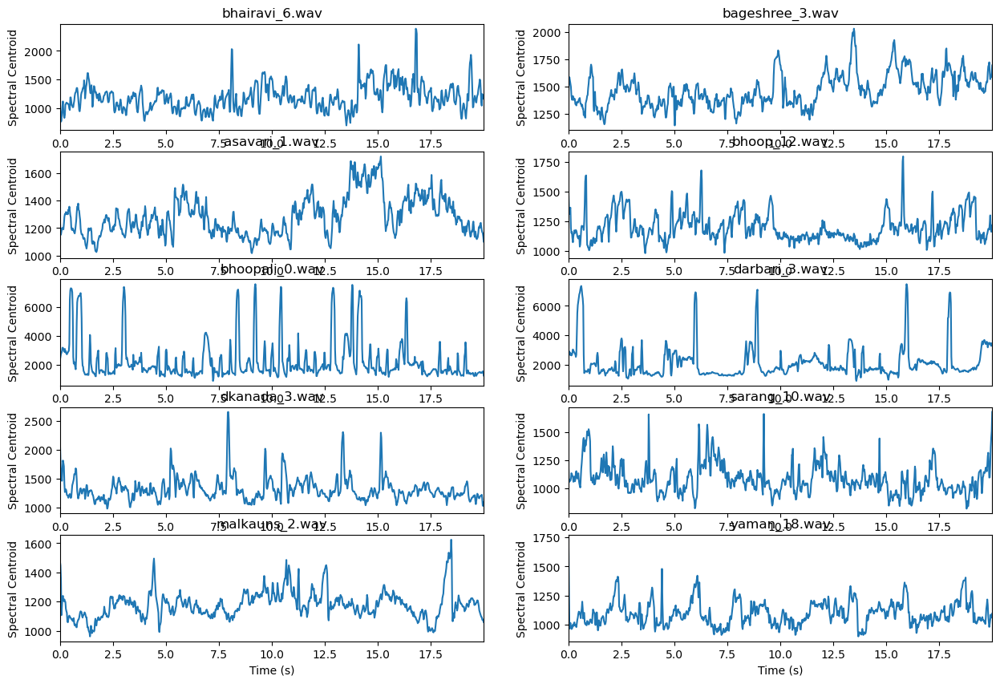

In [49]:
plt.figure(figsize=(15, 10))

def plot_spectral_centroid(y, sr, subplot_index, title):
    ax = plt.subplot(5, 2, subplot_index)
    centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
    centroids = centroids + 1e-10  # Avoid log(0) issues
    times = librosa.times_like(centroids)

    plt.plot(times, centroids)
    plt.title(title)
    plt.xlabel('time')
    plt.ylabel('spectral centroid')
    plt.xlim([0, times[-1]])
    
for sample in sample_list:
    y, sr = librosa.load(sample)
    plot_spectral_centroid(y, sr, sample_list.index(sample) + 1, sample.split('/')[-1])

## plotting the pitches

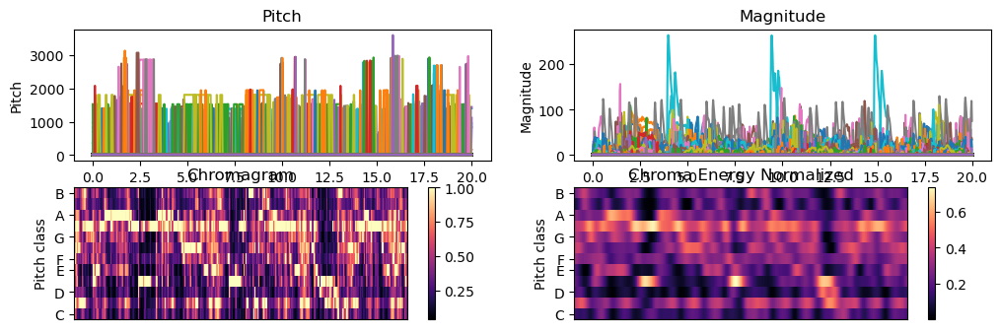

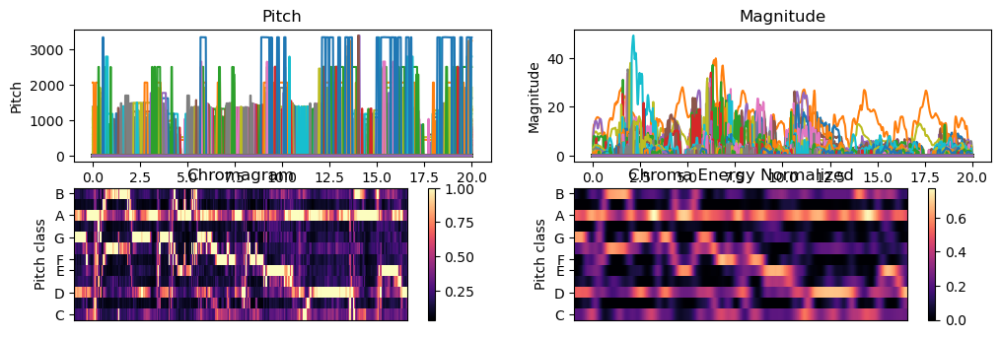

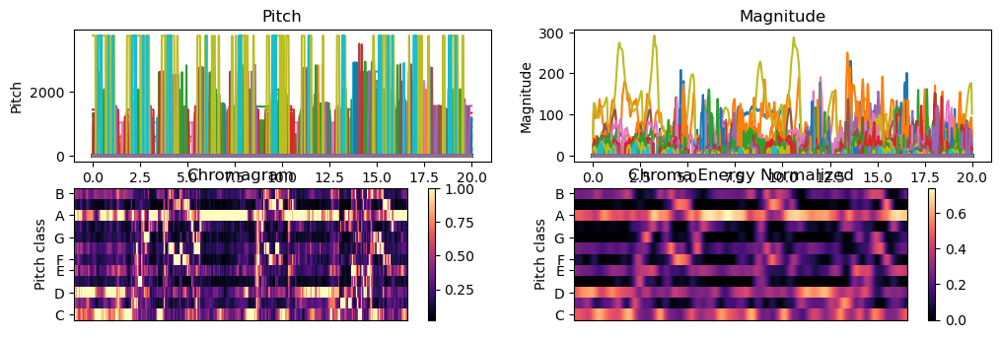

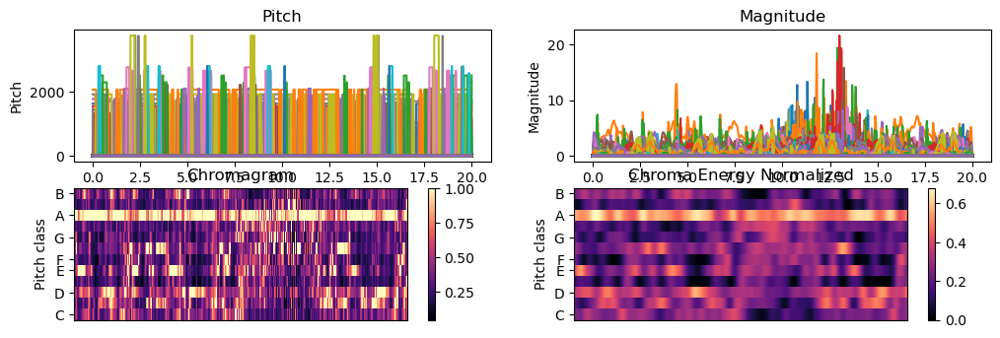

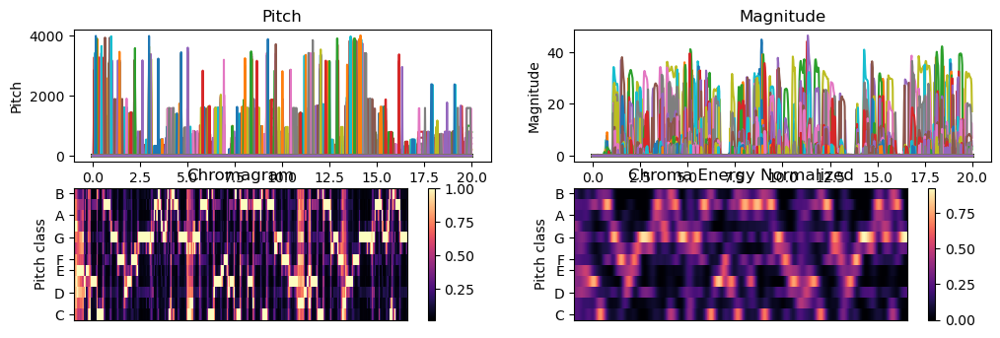

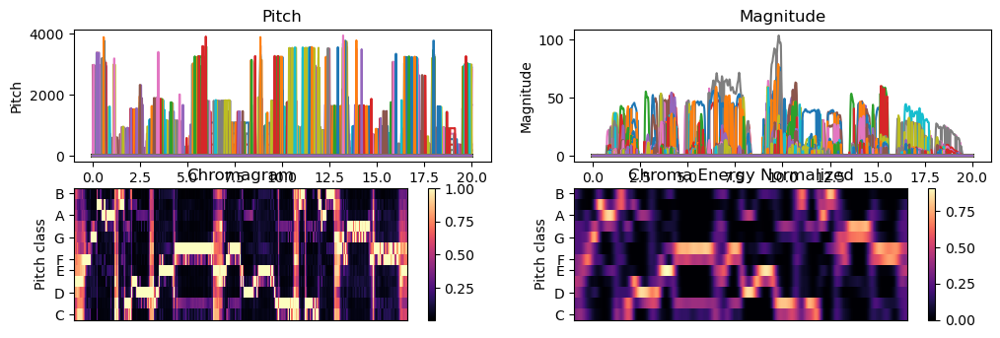

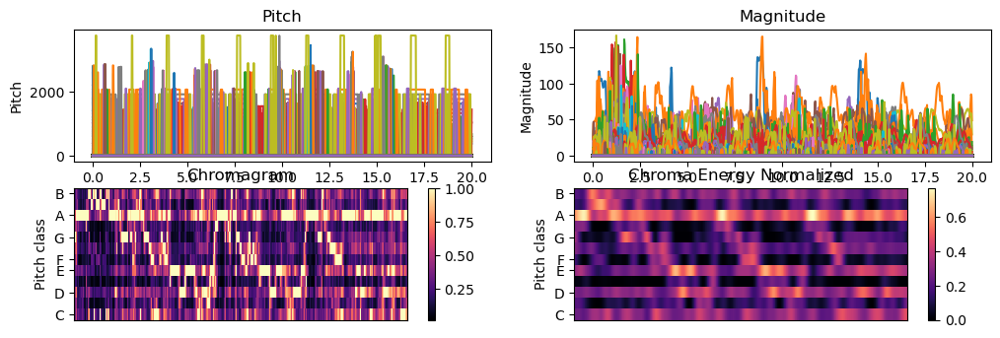

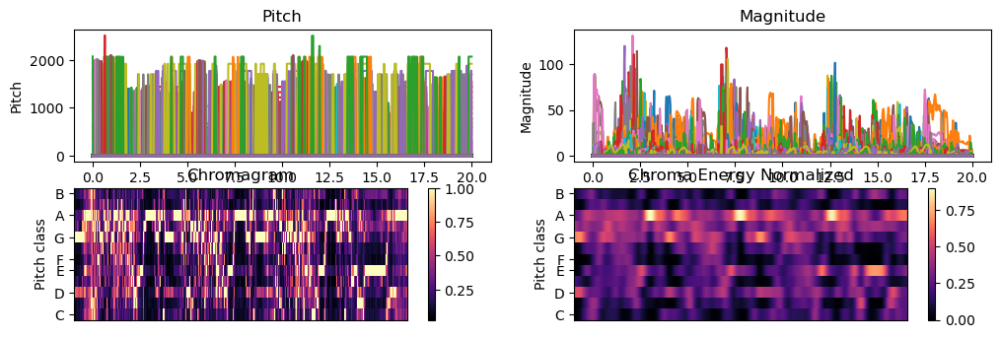

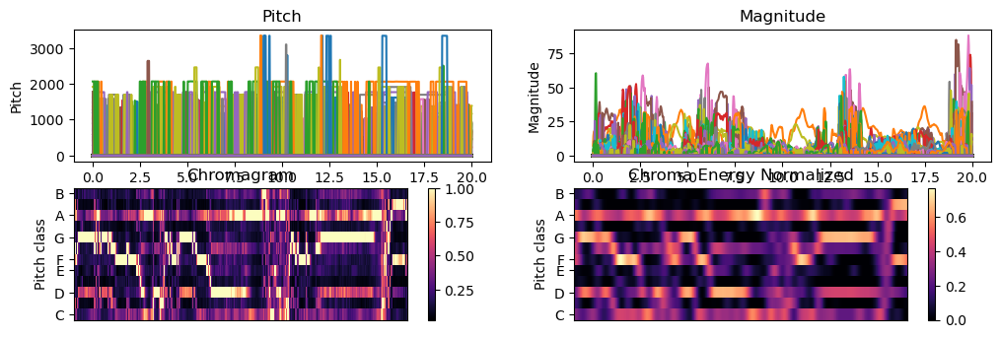

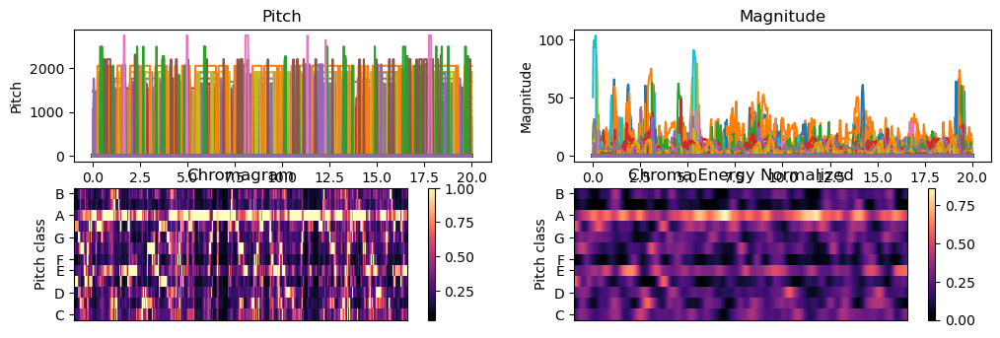

In [50]:
for sample in sample_list:
    y, sr = librosa.load(sample)
    hramonic, percussive = librosa.effects.hpss(y)
    pitch, magnitude = librosa.piptrack(y=hramonic, sr=sr)
    
    plt.figure(figsize=(12, 8))

    plt.subplot(4, 2, 1)
    plt.plot(librosa.times_like(pitch), pitch.T)
    plt.xlabel('time')
    plt.ylabel('pitch')
    plt.title('pitch')
    
    plt.subplot(4, 2, 2)
    plt.plot(librosa.times_like(magnitude), magnitude.T)
    plt.xlabel('time')
    plt.ylabel('magnitude')
    plt.title('magnitude')
    
    plt.subplot(4, 2, 3)
    C = librosa.feature.chroma_cqt(y=y, sr=sr)
    librosa.display.specshow(C, y_axis='chroma')
    plt.colorbar()
    plt.title('chromagram')
    
    plt.subplot(4, 2, 4)
    C = librosa.feature.chroma_cens(y=y, sr=sr)
    librosa.display.specshow(C, y_axis='chroma')
    plt.colorbar()
    plt.title('chroma energy (normalized)')

    plt.show()
        

## plotting the onset strenght and beat

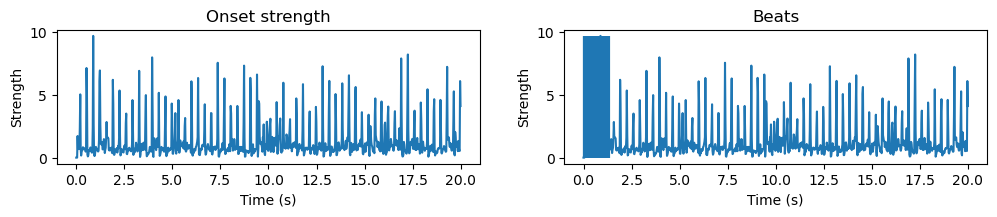

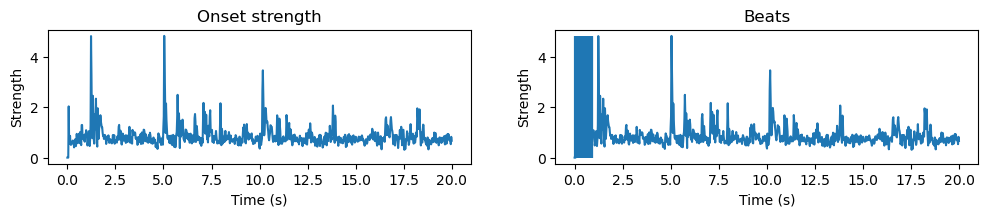

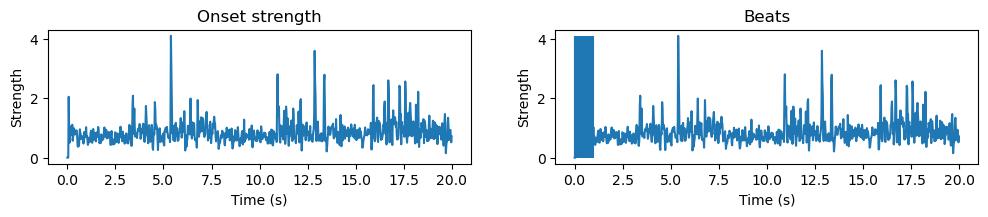

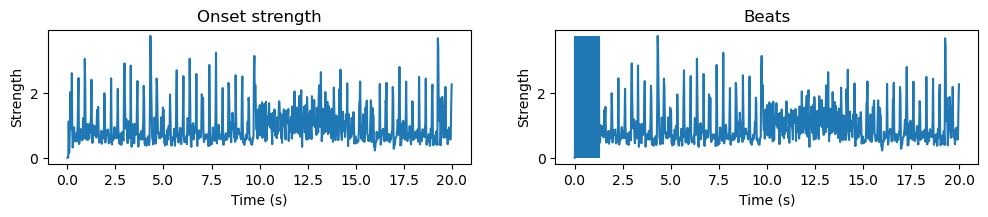

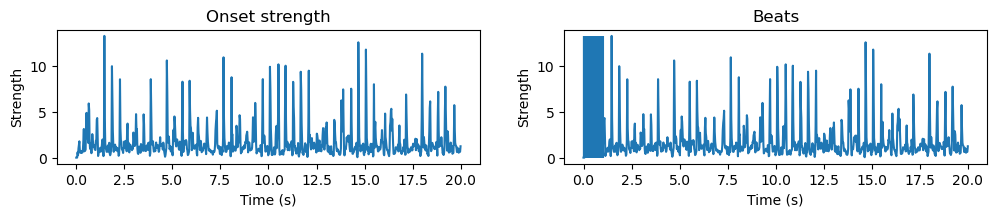

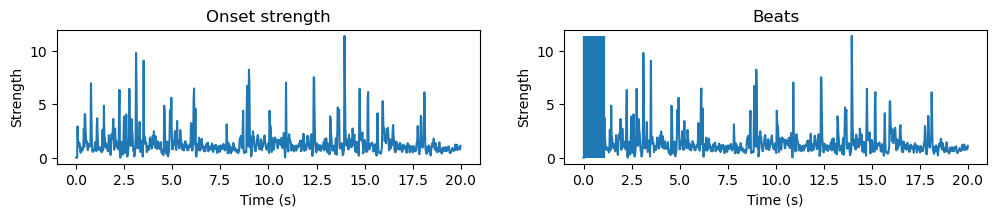

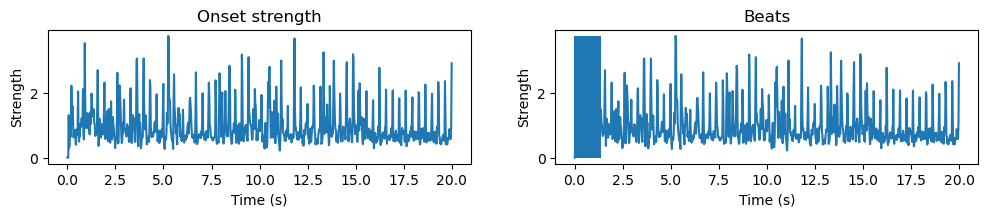

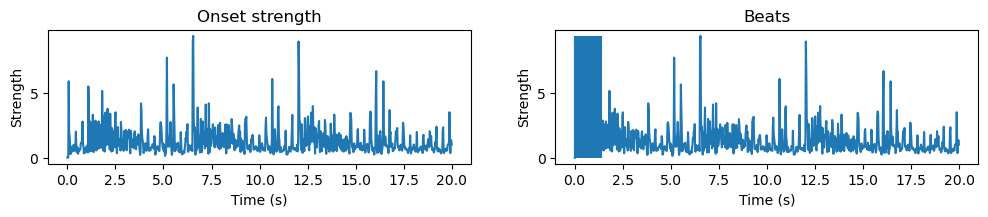

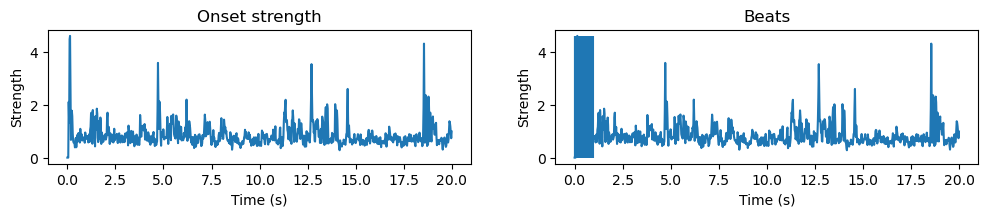

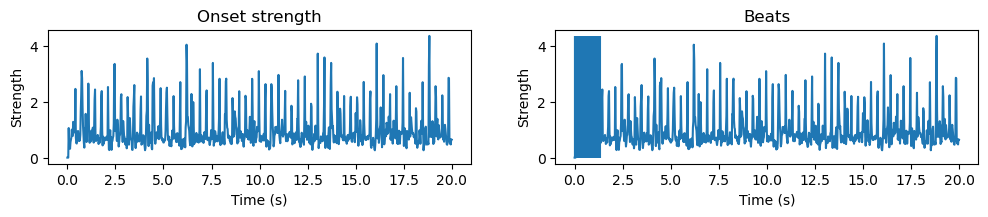

In [51]:
for sample in sample_list:
    y , sr = librosa.load(sample)
    tempo, _ = librosa.beat.beat_track(y=y, sr=sr)
    onset_env = librosa.onset.onset_strength(y=y, sr=sr)
    tempo, beats = librosa.beat.beat_track(onset_envelope=onset_env, sr=sr)
    
    plt.figure(figsize=(12, 8))
    
    plt.subplot(4, 2, 1)
    plt.plot(librosa.times_like(onset_env), onset_env, label='onset strength')
    plt.title('onset strength')
    plt.xlabel('time')
    plt.ylabel('strength')
    
    plt.subplot(4, 2, 2)
    plt.plot(librosa.times_like(onset_env), onset_env, label='onset strength')
    plt.vlines(librosa.times_like(librosa.frames_to_time(beats)), 0, onset_env.max(), label='Beats')
    plt.title('beats')
    plt.xlabel('time')
    plt.ylabel('strength')
    
    plt.show()

## get the min-max values of MFCC and Zero crossing rate for each sample

In [67]:
import pandas as pd

df = pd.DataFrame(columns=['sample', 'zcr', 'min_zcr', 'max_zcr', "mfcc", "min_mfcc", "max_mfcc"])
data = []
for sample in sample_list:
    y, sr = librosa.load(sample)
    zcr = librosa.feature.zero_crossing_rate(y)
    mfcc = librosa.feature.mfcc(y=y, sr=sr)
    mean_mfcc = np.mean(mfcc, axis=1)
    
    data.append({'zcr': np.mean(zcr), 'sample': sample, 'min_zcr': np.min(zcr), 'max_zcr': np.max(zcr), 'mfcc': np.mean(mean_mfcc), 'min_mfcc': np.min(mean_mfcc), 'max_mfcc': np.max(mean_mfcc)})

df = pd.concat([df, pd.DataFrame(data)], ignore_index=True)

/var/folders/pp/bs011m9j6bj_wg2ql0hl_psm0000gn/T/ipykernel_51597/1615297183.py:13: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame(data)], ignore_index=True)


In [68]:
df


,sample,zcr,min_zcr,max_zcr,mfcc,min_mfcc,max_mfcc
0,./raaga/bhairavi/bhairavi_6.wav,0.065263,0.018066,0.146973,-2.174617,-109.275253,165.312576
1,./raaga/bageshree/bageshree_3.wav,0.066721,0.032715,0.119141,-10.103937,-265.327118,132.001022
2,./raaga/asavari/asavari_1.wav,0.080761,0.033691,0.136230,-13.679355,-99.014969,155.270004
3,./raaga/bhoop/bhoop_12.wav,0.087204,0.047852,0.139648,-13.800756,-369.683441,188.179123
4,./raaga/bhoopali/bhoopali_0.wav,0.102137,0.010254,0.696777,-10.042319,-296.320038,75.324745
5,./raaga/darbari/darbari_3.wav,0.089921,0.016113,0.660645,-10.687387,-292.567688,64.556000
6,./raaga/dkanada/dkanada_3.wav,0.081709,0.030273,0.141113,-4.841440,-103.886086,163.161148
7,./raaga/sarang/sarang_10.wav,0.064924,0.029297,0.136230,-7.757911,-212.732422,181.692398
8,./raaga/malkauns/malkauns_2.wav,0.070401,0.040039,0.118164,-7.872837,-229.251419,169.454773
9,./raaga/yaman/yaman_18.wav,0.077116,0.029785,0.132812,-7.533763,-242.459595,197.765854


## Summary

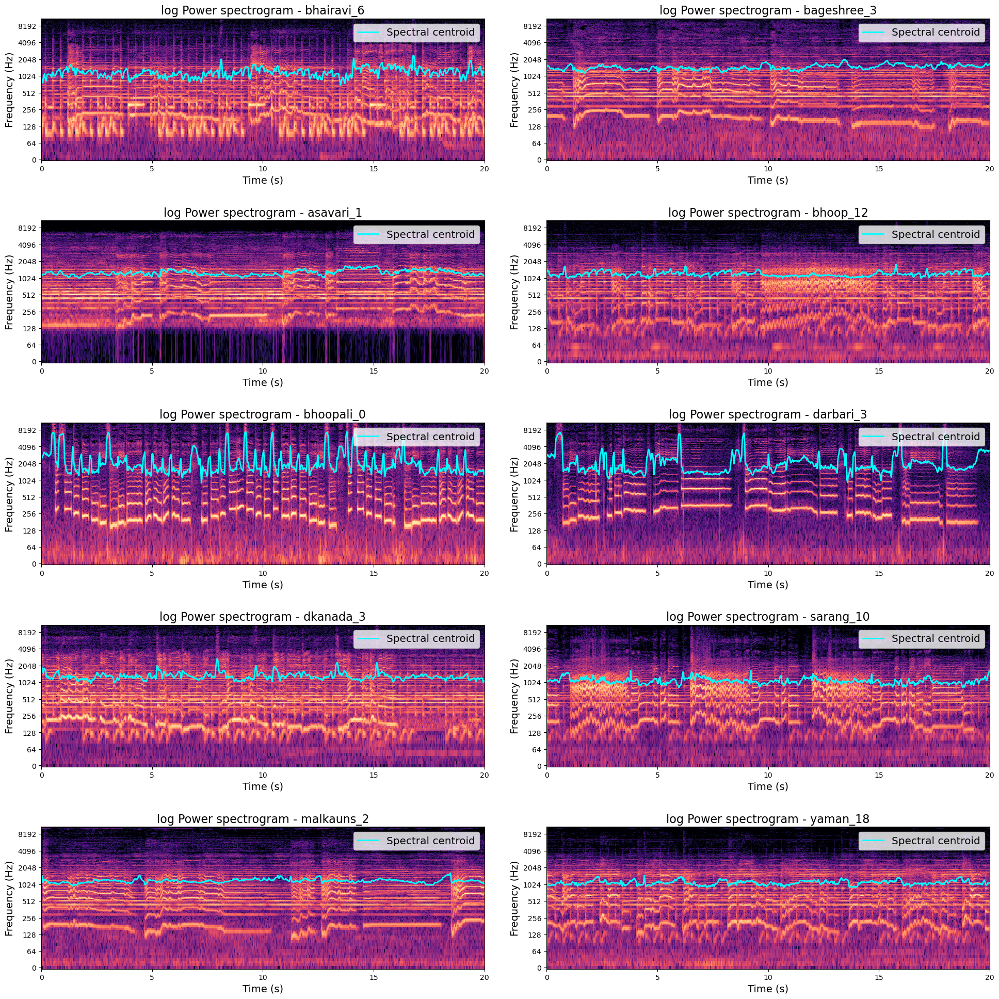

In [88]:
def calculate_magnitude_phase(y, sr):
    stft_result = librosa.stft(y)
    magnitude, phase = librosa.magphase(stft_result)
    return magnitude, phase

fig, axs = plt.subplots(5, 2, figsize=(20, 20))
axs = axs.flatten()

for i in range(len(sample_list)):
    y, sr = librosa.load(sample_list[i])
    centroid = librosa.feature.spectral_centroid(y=y, sr=sr)
    magnitude, phase = calculate_magnitude_phase(y, sr)
    times = librosa.times_like(centroid)

    # Plotting the spectrogram
    img = librosa.display.specshow(librosa.amplitude_to_db(magnitude, ref=np.max), sr=sr, y_axis='log', x_axis='time', ax=axs[i])
    # Plotting the spectral centroid with adjusted color and line width
    axs[i].plot(times, centroid.T, label='Spectral centroid', color='cyan', linewidth=2)
    axs[i].legend(loc='upper right', fontsize='x-large')
    
    # Setting titles and labels with adjusted font sizes
    axs[i].set_title(f'log Power spectrogram - {sample_list[i].split("/")[-1][:-4]}', fontsize=16)
    axs[i].set_xlabel('Time (s)', fontsize=14)
    axs[i].set_ylabel('Frequency (Hz)', fontsize=14)

plt.tight_layout(pad=3.0)
plt.show()